In [3]:
from sklearn.datasets import load_boston
import pandas as pd
X, y = load_boston(return_X_y = True)
df_boston = pd.DataFrame(X)

In [4]:
df_boston.duplicated().sum()
df_boston.isna().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
dtype: int64

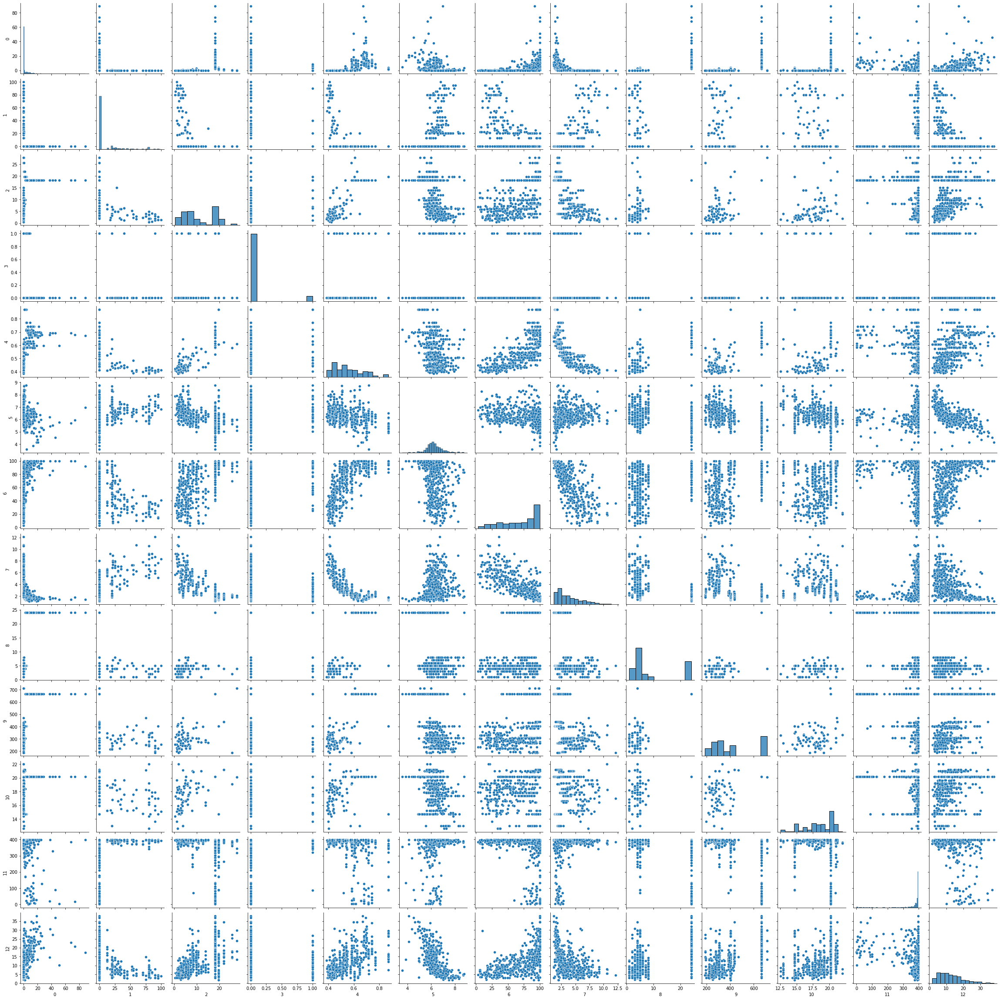

In [36]:
import seaborn as sns 
sns.pairplot(df_boston)

<AxesSubplot:ylabel='Count'>

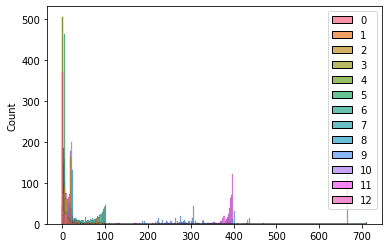

In [37]:
sns.histplot(df_boston)

In [7]:
df_boston.corr() #correlation matrix

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621
1,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995
2,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800
3,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929
4,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879
5,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808
6,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339
7,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996
8,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676
9,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993


<AxesSubplot:>

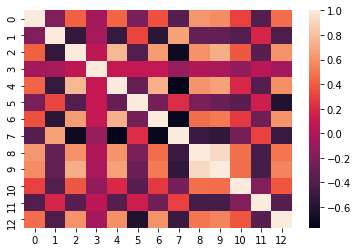

In [18]:
df_corr = df_boston.corr()
sns.heatmap(df_corr)

In [21]:
#drop correlated features
threshold = 1
columns = np.full((df_corr.shape[0],), True, dtype=bool)
for i in range(df_corr.shape[0]):
    for j in range(i+1, df_corr.shape[0]):
        if df_corr.iloc[i,j] >= threshold:
            if columns[j]:
                columns[j] = False
selected_columns = df_boston.columns[columns]
selected_columns
df_boston = df_boston[selected_columns]

In [31]:
df_boston.shape

(506, 13)

In [28]:
Q1 = df_boston.quantile(0.25)
Q3 = df_boston.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

0       3.595038
1      12.500000
2      12.910000
3       0.000000
4       0.175000
5       0.738000
6      49.050000
7       3.088250
8      20.000000
9     387.000000
10      2.800000
11     20.847500
12     10.005000
dtype: float64


In [29]:
#drop outliers
boston_df_out = df_boston[~((df_boston < (Q1 - 1.5 * IQR)) |(df_boston > (Q3 + 1.5 * IQR))).any(axis=1)]
boston_df_out.shape

(274, 13)

In [35]:
#normalize data
from sklearn import preprocessing
normalized_df = preprocessing.normalize(boston_df_out, norm='l2')
print(normalized_df)

[[1.26388341e-05 3.59966795e-02 4.61957387e-03 ... 3.05971776e-02
  7.93726783e-01 9.95908132e-03]
 [5.78529889e-05 0.00000000e+00 1.49769546e-02 ... 3.77071843e-02
  8.40785474e-01 1.93620036e-02]
 [5.85729947e-05 0.00000000e+00 1.51744622e-02 ... 3.82044450e-02
  8.43137761e-01 8.64965806e-03]
 ...
 [1.23765824e-04 0.00000000e+00 2.43009593e-02 ... 4.27762066e-02
  8.08470305e-01 1.14884669e-02]
 [2.24644719e-04 0.00000000e+00 2.44548909e-02 ... 4.30471676e-02
  8.06519433e-01 1.32831260e-02]
 [9.69214289e-05 0.00000000e+00 2.43887924e-02 ... 4.29308164e-02
  8.11392431e-01 1.61092778e-02]]


In [44]:
#split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print("train:",X_train.shape,"\ntest:",X_test.shape)

train: (354, 13) 
test: (152, 13)


In [50]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import r

In [67]:
from sklearn.metrics import r2_score
#train results
print("\nLasso 1 for alpha=3(train)")
lasso_model1 = Lasso(alpha=3)
lasso_model1.fit(X_train, y_train)
print(lasso_model1.coef_)
print("\nLasso 2 for alpha=30(train)")
lasso_model2 = Lasso(alpha=30)
lasso_model2.fit(X_train, y_train)
print(lasso_model2.coef_)
print("\nLasso 3 for alpha=0.3(train)")
lasso_model3 = Lasso(alpha=0.3)
lasso_model3.fit(X_train, y_train)
print(lasso_model3.coef_)
print("\nLasso 4 for alpha=100(train)")
lasso_model4 = Lasso(alpha=100)
lasso_model4.fit(X_train, y_train)
print(lasso_model4.coef_)
print("\nLasso 5 for alpha=500(train)")
lasso_model5 = Lasso(alpha=500)
lasso_model5.fit(X_train, y_train)
print(lasso_model5.coef_)

#test results
print("\nLasso 1 for alpha=3(test)")
lasso_model1t = Lasso(alpha=3)
lasso_model1t.fit(X_test, y_test)
print(lasso_model1t.coef_)
print("\nLasso 2 for alpha=30(test)")
lasso_model2t = Lasso(alpha=30)
lasso_model2t.fit(X_test, y_test)
print(lasso_model2t.coef_)
print("\nLasso 3 for alpha=0.3(test)")
lasso_model3t = Lasso(alpha=0.3)
lasso_model3t.fit(X_test, y_test)
print(lasso_model3t.coef_)
print("\nLasso 4 for alpha=100(test)")
lasso_model4t = Lasso(alpha=100)
lasso_model4t.fit(X_test, y_test)
print(lasso_model4t.coef_)
print("\nLasso 5 for alpha=500(test)")
lasso_model5t = Lasso(alpha=500)
lasso_model5t.fit(X_test, y_test)
print(lasso_model5t.coef_)


Lasso 1 for alpha=3(train)
[-0.01725854  0.02317058 -0.          0.          0.          0.
  0.03287172 -0.          0.         -0.00383655 -0.29157284  0.0091025
 -0.84326073]

Lasso 2 for alpha=30(train)
[-0.          0.015721   -0.          0.         -0.          0.
 -0.         -0.          0.         -0.01901785 -0.          0.01328617
 -0.08541266]

Lasso 3 for alpha=0.3(train)
[-0.11970082  0.03863492 -0.          0.         -0.          3.32669376
 -0.01003762 -1.00884538  0.22239031 -0.01068143 -0.74637584  0.01236299
 -0.64997521]

Lasso 4 for alpha=100(train)
[-0.          0.         -0.          0.         -0.          0.
 -0.          0.         -0.         -0.02067784 -0.          0.00566794
 -0.        ]

Lasso 5 for alpha=500(train)
[-0.          0.         -0.          0.         -0.          0.
 -0.          0.         -0.         -0.00741897 -0.          0.
 -0.        ]

Lasso 1 for alpha=3(test)
[-0.          0.06318173 -0.          0.         -0.          0.
  

In [68]:
#train
print("\nRidge 1 for alpha=3(train)")
ridge_model1 = Ridge(alpha=3)
ridge_model1.fit(X_train, y_train)
print(ridge_model1.coef_)
print("\nRidge 2 for alpha=30(train)")
ridge_model2 = Ridge(alpha=30)
ridge_model2.fit(X_train, y_train)
print(ridge_model2.coef_)
print("\nRidge 3 for alpha=0.3(train)")
ridge_model3 = Ridge(alpha=0.3)
ridge_model3.fit(X_train, y_train)
print(ridge_model3.coef_)
print("\nRidge 4 for alpha=100(train)")
ridge_model4 = Ridge(alpha=100)
ridge_model4.fit(X_train, y_train)
print(ridge_model4.coef_)
print("\nRidge 5 for alpha=500(train)")
ridge_model5 = Ridge(alpha=500)
ridge_model5.fit(X_train, y_train)
print(ridge_model5.coef_)

#test
print("\nRidge 1 for alpha=3(test)")
ridge_model1t = Ridge(alpha=3)
ridge_model1t.fit(X_test, y_test)
print(ridge_model1t.coef_)
print("\nRidge 2 for alpha=30(test)")
ridge_model2t = Ridge(alpha=30)
ridge_model2t.fit(X_test, y_test)
print(ridge_model2t.coef_)
print("\nRidge 3 for alpha=0.3(test)")
ridge_model3t = Ridge(alpha=0.3)
ridge_model3t.fit(X_test, y_test)
print(ridge_model3t.coef_)
print("\nRidge 4 for alpha=100(test)")
ridge_model4t = Ridge(alpha=100)
ridge_model4t.fit(X_test, y_test)
print(ridge_model4t.coef_)
print("\nRidge 5 for alpha=500(test)")
ridge_model5t = Ridge(alpha=500)
ridge_model5t.fit(X_test, y_test)
print(ridge_model5t.coef_)


Ridge 1 for alpha=3(train)
[-1.26379604e-01  3.78742131e-02  1.85893633e-03  2.68114146e+00
 -3.95182003e+00  4.01192002e+00 -1.99840378e-02 -1.21415846e+00
  2.19728612e-01 -9.84166648e-03 -7.87744303e-01  1.20993466e-02
 -5.76653188e-01]

Ridge 2 for alpha=30(train)
[-0.1287015   0.04200741 -0.01609474  1.33490657 -0.4994607   3.22448133
 -0.01531919 -1.154494    0.24407384 -0.01122812 -0.7888085   0.01207816
 -0.64508408]

Ridge 3 for alpha=0.3(train)
[-1.31102630e-01  3.62935301e-02  3.50511575e-02  3.05271864e+00
 -1.19601370e+01  4.06601733e+00 -1.38151686e-02 -1.33366353e+00
  2.34501884e-01 -8.99972171e-03 -8.72097568e-01  1.18807668e-02
 -5.54061226e-01]

Ridge 4 for alpha=100(train)
[-0.13028354  0.04487951 -0.02655016  0.61111052 -0.14154005  2.13341762
 -0.00419869 -1.06661305  0.2714209  -0.0121186  -0.81232742  0.01161532
 -0.72158673]

Ridge 5 for alpha=500(train)
[-0.12344924  0.04406695 -0.02825896  0.16958391 -0.01725605  0.78239041
  0.01791639 -0.6912268   0.269843

Coefficents will so close to zero when the alpha is bigger number like 500 and it means there is faults.